In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
sales_df=pd.read_csv('sales_data_set.csv')
sales_df

,Store,Dept,Date,Weekly_Sales,IsHoliday
0,1,1,05-02-10,24924.50,False
1,1,1,12-02-10,46039.49,True
2,1,1,19-02-10,41595.55,False
3,1,1,26-02-10,19403.54,False
4,1,1,05-03-10,21827.90,False
...,...,...,...,...,...
421565,45,98,28-09-12,508.37,False
421566,45,98,05-10-12,628.10,False
421567,45,98,12-10-12,1061.02,False
421568,45,98,19-10-12,760.01,False


In [3]:
sales_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 421570 entries, 0 to 421569
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Store         421570 non-null  int64  
 1   Dept          421570 non-null  int64  
 2   Date          421570 non-null  object 
 3   Weekly_Sales  421570 non-null  float64
 4   IsHoliday     421570 non-null  bool   
dtypes: bool(1), float64(1), int64(2), object(1)
memory usage: 13.3+ MB


In [4]:
sales_stores=sales_df['Store'].unique()
sales_stores

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45], dtype=int64)

In [5]:
sales_dept={}
for i in sales_stores:
    dept=sales_df['Dept'][sales_df['Store']==i].unique()
    sales_dept[i] = (dept)
print(sales_dept)



{1: array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 16, 17, 18,
       19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
       36, 37, 38, 40, 41, 42, 44, 45, 46, 47, 48, 49, 51, 52, 54, 55, 56,
       58, 59, 60, 67, 71, 72, 74, 77, 78, 79, 80, 81, 82, 83, 85, 87, 90,
       91, 92, 93, 94, 95, 96, 97, 98, 99], dtype=int64), 2: array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 16, 17, 18,
       19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
       36, 37, 38, 39, 40, 41, 42, 44, 45, 46, 47, 48, 49, 51, 52, 54, 55,
       56, 58, 59, 60, 67, 71, 72, 74, 77, 78, 79, 80, 81, 82, 83, 85, 87,
       90, 91, 92, 93, 94, 95, 96, 97, 98, 99], dtype=int64), 3: array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 16, 17, 18,
       19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
       36, 38, 40, 41, 42, 44, 45, 46, 47, 49, 51, 52, 54, 55, 56, 59, 60,
       67, 71, 72, 74, 77, 78, 79, 80, 81, 82

In [6]:
sales_df['Date']=pd.to_datetime(sales_df['Date'], format='%d-%m-%y')

In [7]:
sales_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 421570 entries, 0 to 421569
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   Store         421570 non-null  int64         
 1   Dept          421570 non-null  int64         
 2   Date          421570 non-null  datetime64[ns]
 3   Weekly_Sales  421570 non-null  float64       
 4   IsHoliday     421570 non-null  bool          
dtypes: bool(1), datetime64[ns](1), float64(1), int64(2)
memory usage: 13.3 MB


In [8]:
df1=sales_df.set_index('Date')

In [9]:
df1.head()

,Store,Dept,Weekly_Sales,IsHoliday
Date,,,,
2010-02-05,1,1,24924.50,False
2010-02-12,1,1,46039.49,True
2010-02-19,1,1,41595.55,False
2010-02-26,1,1,19403.54,False
2010-03-05,1,1,21827.90,False


In [10]:
df1.loc[df1['Weekly_Sales']<0, 'Weekly_Sales']=0
df1=df1

In [11]:
df1[df1['Weekly_Sales']==0]

,Store,Dept,Weekly_Sales,IsHoliday
Date,,,,
2012-08-10,1,6,0.0,False
2012-05-04,1,18,0.0,False
2010-02-19,1,47,0.0,False
2010-03-12,1,47,0.0,False
2010-10-08,1,47,0.0,False
...,...,...,...,...
2010-02-12,45,80,0.0,True
2010-02-19,45,80,0.0,False
2010-04-16,45,80,0.0,False


In [12]:
df1['IsHoliday'] = df1['IsHoliday'].map({False:0, True:1})

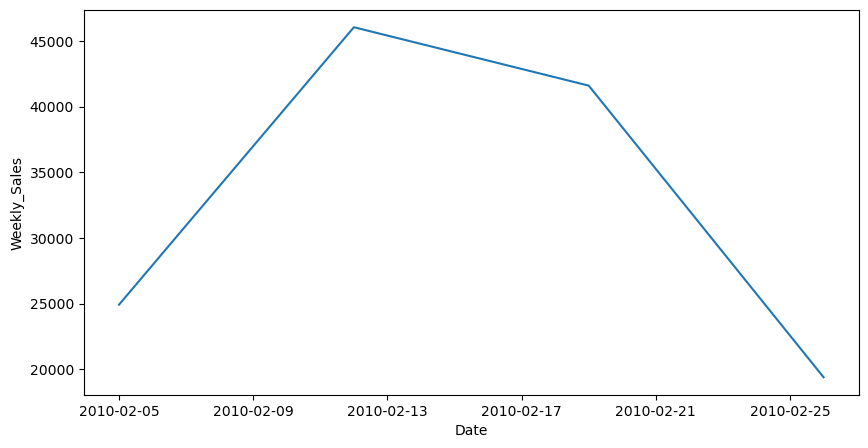

In [13]:
plt.figure( figsize=( 10,5))
sns.lineplot( data=df1[ ( df1['Store']==1) & (df1['Dept'] == 1)].iloc[:4], 
             x = df1[ ( df1['Store']==1) & (df1['Dept'] == 1)].iloc[:4].index,
             y ='Weekly_Sales')
plt.show()

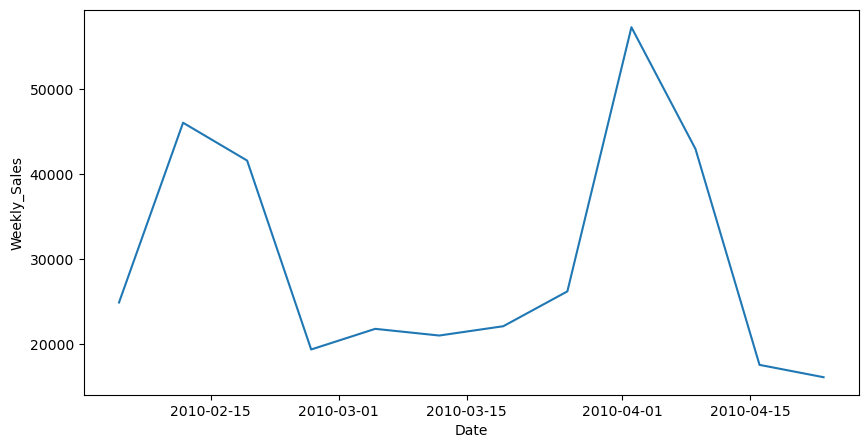

In [14]:
plt.figure( figsize=( 10,5))
sns.lineplot( data=df1[ ( df1['Store']==1) & (df1['Dept'] == 1)].iloc[:4*3], 
             x = df1[ ( df1['Store']==1) & (df1['Dept'] == 1)].iloc[:4*3].index,
             y ='Weekly_Sales')
plt.show()

In [15]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [16]:
train_size = int(df1['Store'].nunique() * 0.7)
val_size = int(df1['Store'].nunique() * 0.1)
test_size = df1['Store'].nunique() - (train_size+val_size)

In [17]:
df2 = df1[['Store','Dept','Weekly_Sales']]
df2.head()

,Store,Dept,Weekly_Sales
Date,,,
2010-02-05,1,1,24924.50
2010-02-12,1,1,46039.49
2010-02-19,1,1,41595.55
2010-02-26,1,1,19403.54
2010-03-05,1,1,21827.90


In [18]:
df2.tail()

,Store,Dept,Weekly_Sales
Date,,,
2012-09-28,45,98,508.37
2012-10-05,45,98,628.10
2012-10-12,45,98,1061.02
2012-10-19,45,98,760.01
2012-10-26,45,98,1076.80


In [19]:
df3 = df2[ (df2['Store'] == 1) & (df2['Dept']==1)]
df3.head()

,Store,Dept,Weekly_Sales
Date,,,
2010-02-05,1,1,24924.50
2010-02-12,1,1,46039.49
2010-02-19,1,1,41595.55
2010-02-26,1,1,19403.54
2010-03-05,1,1,21827.90


In [20]:
scaled_train = scaler.fit_transform( df3[['Weekly_Sales']].values)
df_scaled_train = pd.DataFrame(scaled_train, columns=['Weekly_Sales'])

In [21]:
df_scaled_train.set_index(df3.index,inplace=True)

In [22]:
df_train = pd.concat([df3[['Store','Dept']],df_scaled_train], axis=1)
df_train.head()

,Store,Dept,Weekly_Sales
Date,,,
2010-02-05,1,1,0.245542
2010-02-12,1,1,2.395781
2010-02-19,1,1,1.943233
2010-02-26,1,1,-0.316684
2010-03-05,1,1,-0.069800


In [23]:
def create_lstm_dataset(data, time_step):
    data_x, data_y = [], []
    for i in range(len(data) - time_step):
        data_x.append(data[i:i+time_step])
        data_y.append(data[i+time_step])
    return np.array(data_x), np.array(data_y)

In [24]:
def store_lstm_dataset(df, time_step):
    X_train , y_train= [], []
    for store in df['Store'].unique():
        df_store = df[ df['Store'] == store]    

        for dept in df_store['Dept'].unique():
            df_dept = df_store[ df_store['Dept'] == dept]
            x_weekly_sales = df_dept['Weekly_Sales'].values
            if len(x_weekly_sales)>time_step:
                train_x, train_y = create_lstm_dataset( x_weekly_sales, time_step)
                X_train.append(train_x)
                y_train.append(train_y)
        
    return np.concatenate(X_train), np.concatenate(y_train)

In [25]:
df_train = df2[ df2['Store']<=train_size]

scaled_train = scaler.fit_transform( df_train[['Weekly_Sales']].values)
df_scaled_train = pd.DataFrame(scaled_train, columns=['Weekly_Sales'])

df_scaled_train.set_index(df_train.index,inplace=True)

df_train = pd.concat([df_train[['Store','Dept']],df_scaled_train], axis=1)
df_train

,Store,Dept,Weekly_Sales
Date,,,
2010-02-05,1,1,0.320682
2010-02-12,1,1,1.198065
2010-02-19,1,1,1.013407
2010-02-26,1,1,0.091272
2010-03-05,1,1,0.192010
...,...,...,...
2012-08-31,31,99,-0.714578
2012-09-07,31,99,-0.714910
2012-09-14,31,99,-0.714993


In [26]:
df_val=df2[ (df2['Store']>train_size) & (df2['Store']<= train_size+val_size)]
scaled_val = scaler.fit_transform( df_val[['Weekly_Sales']].values)
df_scaled_val = pd.DataFrame(scaled_val, columns=['Weekly_Sales'])

df_scaled_val.set_index(df_val.index,inplace=True)

df_val = pd.concat([df_val[['Store','Dept']],df_scaled_val], axis=1)
df_val

,Store,Dept,Weekly_Sales
Date,,,
2010-02-05,32,1,0.549789
2010-02-12,32,1,1.329167
2010-02-19,32,1,0.711166
2010-02-26,32,1,0.284566
2010-03-05,32,1,0.358729
...,...,...,...
2012-09-28,35,98,-0.734922
2012-10-05,35,98,-0.736169
2012-10-12,35,98,-0.734214


In [27]:
X_train, y_train = store_lstm_dataset( df_train, 12 )
X_train = np.reshape( X_train, (X_train.shape[0],1, X_train.shape[1]))
print(f'Train_size: {X_train.shape}')

Train_size: (276353, 1, 12)


In [28]:
X_val, y_val = store_lstm_dataset( df_val, 12 )
X_val = np.reshape( X_val, (X_val.shape[0],1, X_val.shape[1]))
print(f'val_size: {X_val.shape}')

val_size: (33061, 1, 12)


In [29]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dropout, Dense
from tensorflow.keras.callbacks import EarlyStopping

In [30]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)


In [31]:
model = Sequential()

In [32]:
model.add( LSTM(512, input_shape = (X_train.shape[1], X_train.shape[2]), return_sequences= True ))
model.add( LSTM(32))
model.add( Dense(1))

C:\Users\HP USER\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [33]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 1, 512)         │     1,075,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 32)             │        69,760 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,144,993 (4.37 MB)

 Trainable params: 1,144,993 (4.37 MB)

 Non-trainable params: 0 (0.00 B)

In [34]:
model.compile( optimizer='adam', loss='mse', metrics=['mae'])

In [35]:
history = model.fit( X_train, y_train, epochs=50, validation_data=( X_val, y_val), verbose=1, callbacks=[early_stopping])

Epoch 1/50
8637/8637 ━━━━━━━━━━━━━━━━━━━━ 186s 21ms/step - loss: 0.0754 - mae: 0.1095 - val_loss: 0.1103 - val_mae: 0.1021
Epoch 2/50
8637/8637 ━━━━━━━━━━━━━━━━━━━━ 153s 18ms/step - loss: 0.0628 - mae: 0.0910 - val_loss: 0.1044 - val_mae: 0.0866
Epoch 3/50
8637/8637 ━━━━━━━━━━━━━━━━━━━━ 201s 18ms/step - loss: 0.0552 - mae: 0.0882 - val_loss: 0.1057 - val_mae: 0.0875
Epoch 4/50
8637/8637 ━━━━━━━━━━━━━━━━━━━━ 152s 18ms/step - loss: 0.0533 - mae: 0.0870 - val_loss: 0.1029 - val_mae: 0.0874
Epoch 5/50
8637/8637 ━━━━━━━━━━━━━━━━━━━━ 152s 18ms/step - loss: 0.0630 - mae: 0.0869 - val_loss: 0.1015 - val_mae: 0.0909
Epoch 6/50
8637/8637 ━━━━━━━━━━━━━━━━━━━━ 151s 18ms/step - loss: 0.0514 - mae: 0.0847 - val_loss: 0.1011 - val_mae: 0.0848
Epoch 7/50
8637/8637 ━━━━━━━━━━━━━━━━━━━━ 158s 18ms/step - loss: 0.0525 - mae: 0.0834 - val_loss: 0.1039 - val_mae: 0.0844
Epoch 8/50
8637/8637 ━━━━━━━━━━━━━━━━━━━━ 169s 20ms/step - loss: 0.0505 - mae: 0.0826 - val_loss: 0.1060 - val_mae: 0.0903
Epoch 9/50
8637/

In [36]:
model.evaluate(X_val, y_val)

1034/1034 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0469 - mae: 0.0862


[0.09935472160577774, 0.08512716740369797]

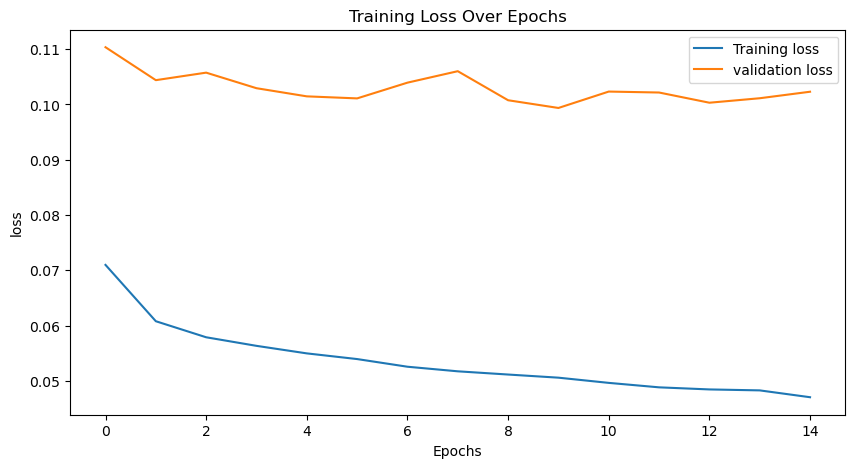

In [37]:
plt.figure( figsize=(10,5))
plt.plot( history.history['loss'], label='Training loss')
plt.plot( history.history['val_loss'], label='validation loss')
plt.xlabel("Epochs")
plt.ylabel('loss')
plt.title('Training Loss Over Epochs')
plt.legend()
plt.show()

In [38]:
prediction = model.predict(X_train)

8637/8637 ━━━━━━━━━━━━━━━━━━━━ 23s 3ms/step


In [39]:
df_train

,Store,Dept,Weekly_Sales
Date,,,
2010-02-05,1,1,0.320682
2010-02-12,1,1,1.198065
2010-02-19,1,1,1.013407
2010-02-26,1,1,0.091272
2010-03-05,1,1,0.192010
...,...,...,...
2012-08-31,31,99,-0.714578
2012-09-07,31,99,-0.714910
2012-09-14,31,99,-0.714993


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step  


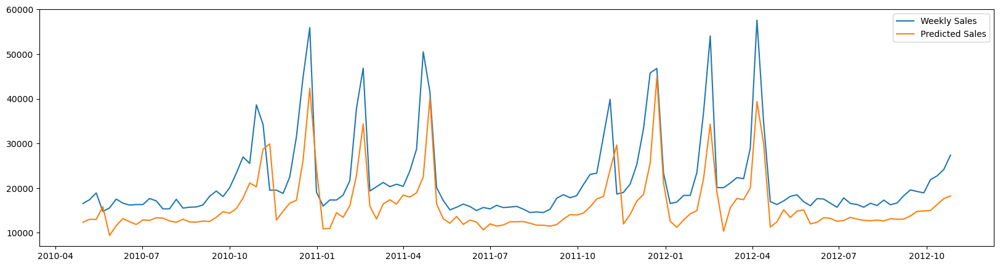

In [40]:
test = df_train[ (df_train['Store']==1) & (df_train['Dept'] == 1)]
if len(test['Dept'].values>12):

    x_test, y_test = store_lstm_dataset( test, 12)
    x_test = np.reshape( x_test, (x_test.shape[0],1,x_test.shape[1]))

    prediction = model.predict(x_test)

    df_pred = pd.DataFrame(scaler.inverse_transform(prediction),columns=['Weekly_Sales'] )

    df_actual = df2[ (df2['Store']==1) & (df2['Dept'] == 1)].iloc[12:]

    df_pred.set_index(df_actual.index,inplace=True)

    df_actual['predicted_sales'] = df_pred['Weekly_Sales']

    plt.figure( figsize=(20,5))
    plt.plot(df_actual['Weekly_Sales'], label='Weekly Sales')
    plt.plot(df_actual['predicted_sales'], label='Predicted Sales')
    plt.legend()
    plt.show()

In [41]:
test

,Store,Dept,Weekly_Sales
Date,,,
2010-02-05,1,1,0.320682
2010-02-12,1,1,1.198065
2010-02-19,1,1,1.013407
2010-02-26,1,1,0.091272
2010-03-05,1,1,0.192010
...,...,...,...
2012-09-28,1,1,0.072335
2012-10-05,1,1,0.195192
2012-10-12,1,1,0.230908


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


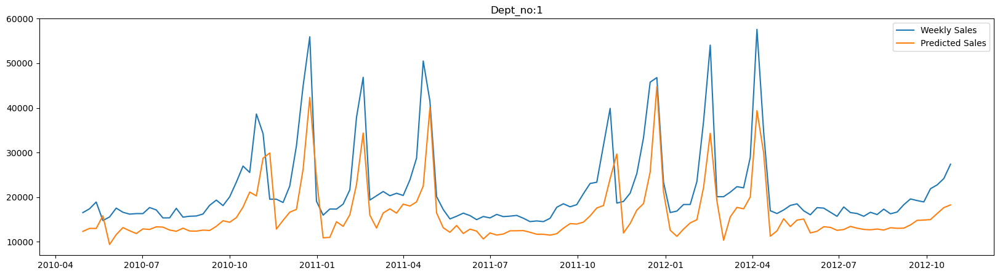

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


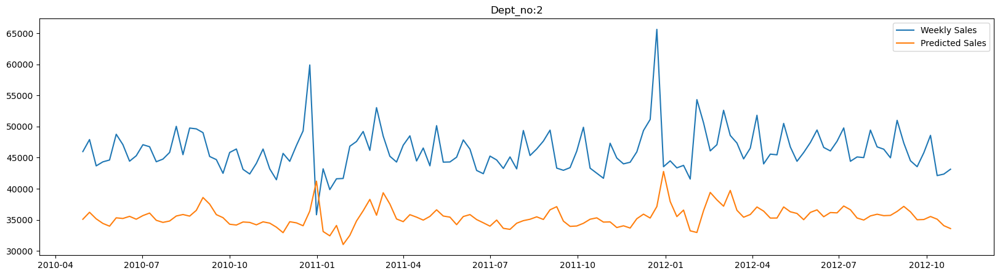

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


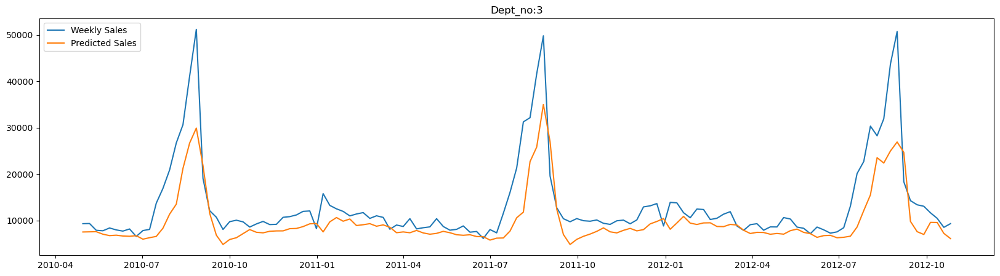

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


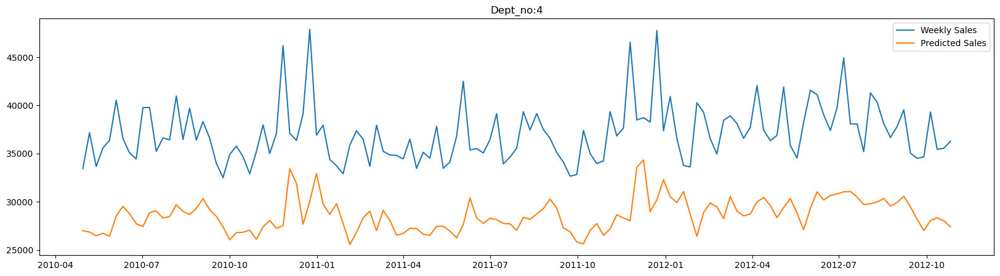

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step  


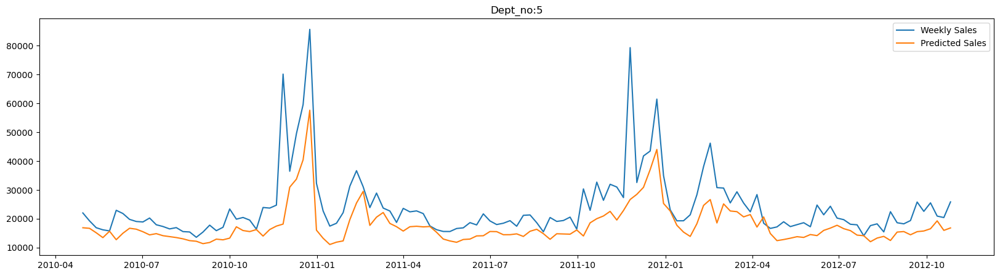

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


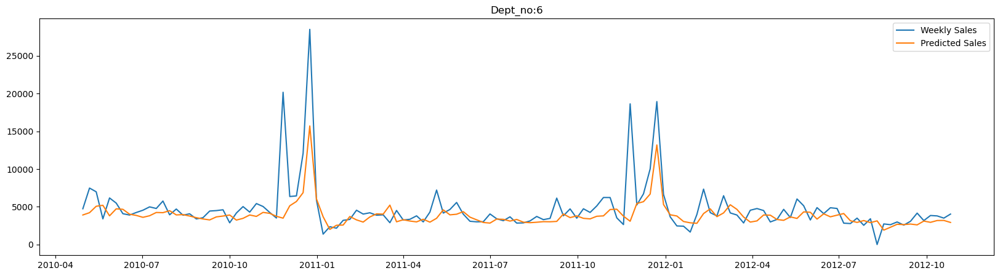

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


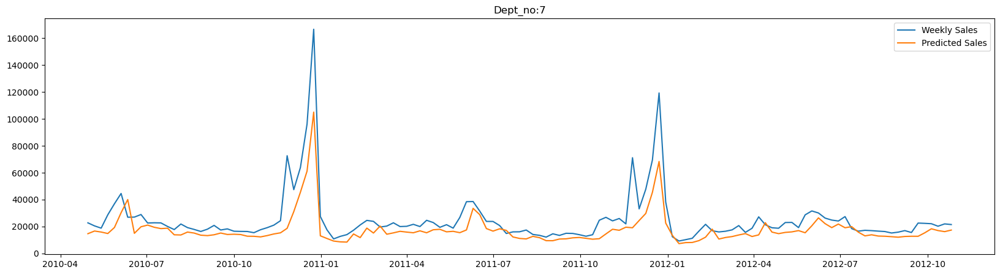

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step  


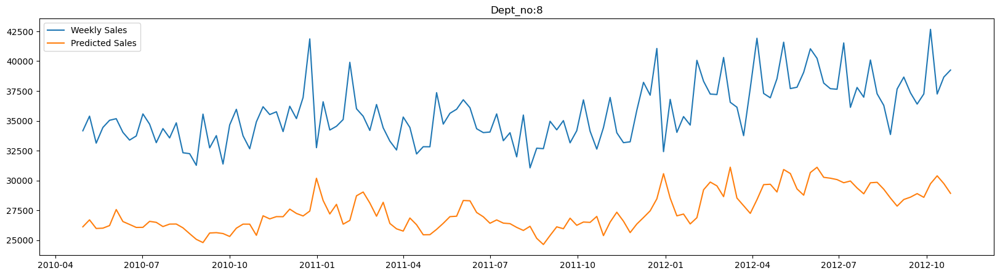

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step  


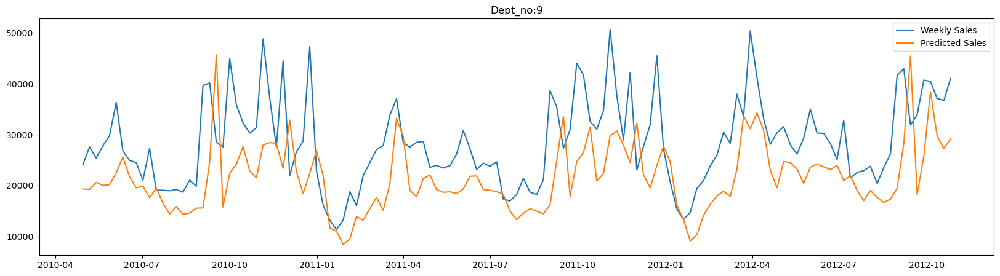

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


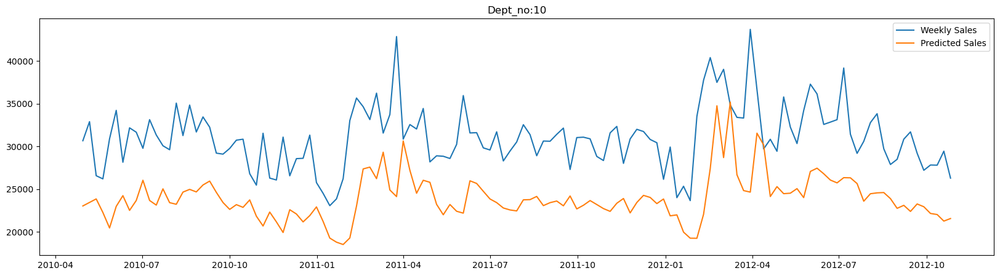

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


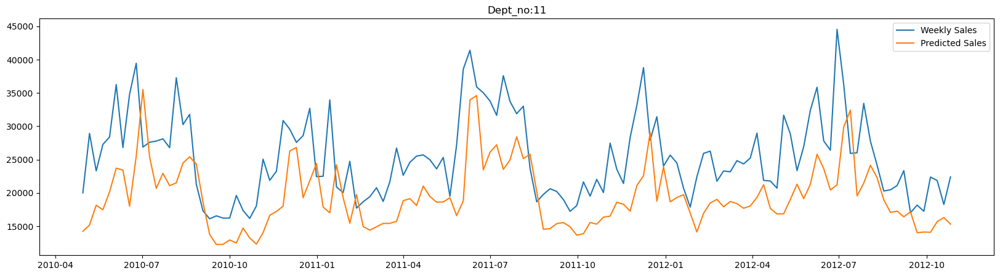

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


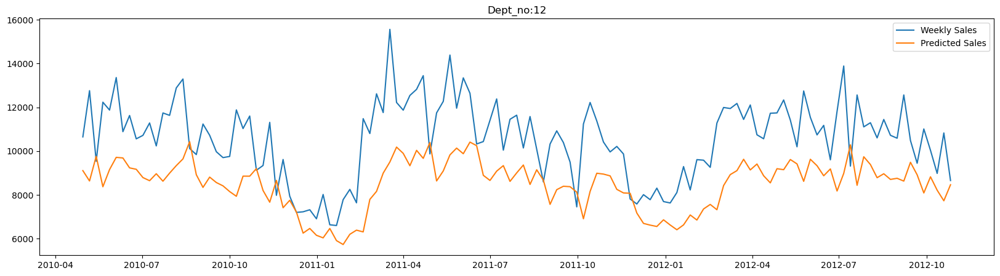

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


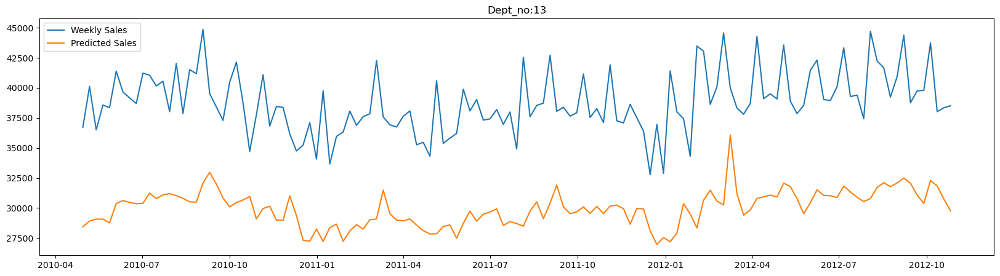

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


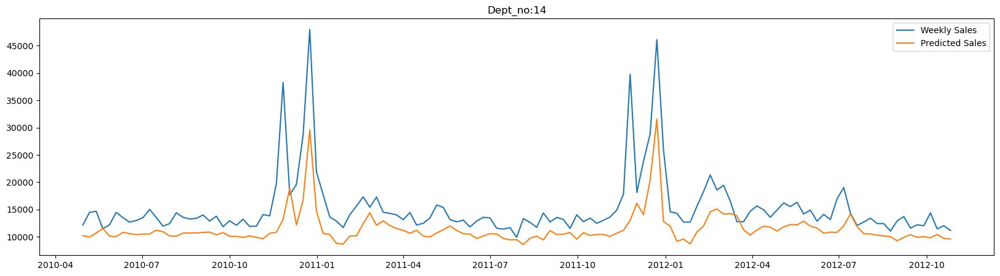

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


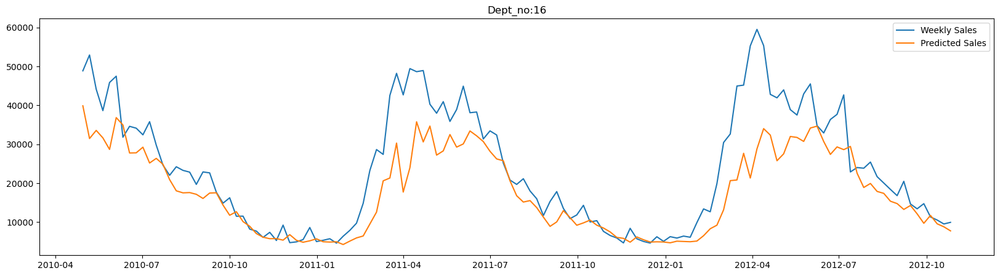

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


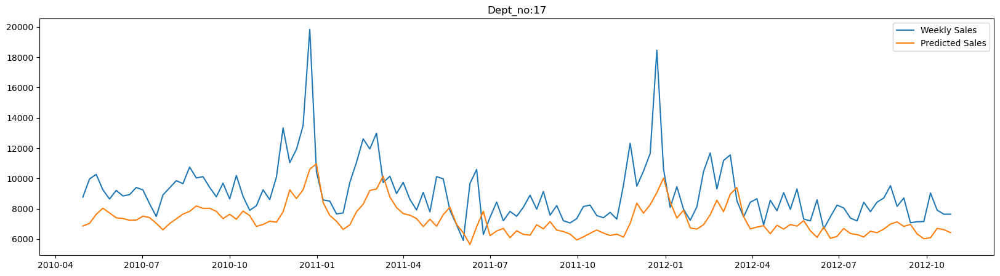

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


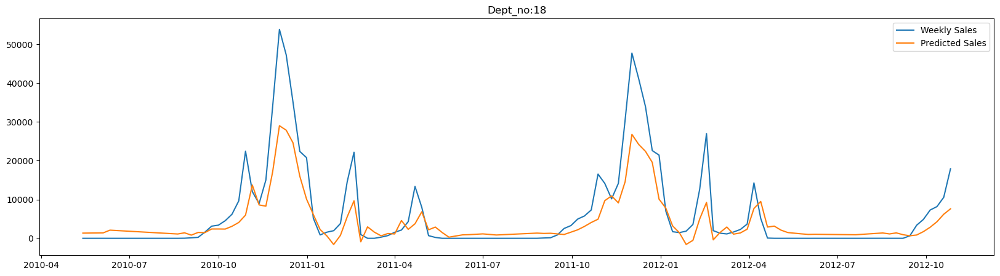

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


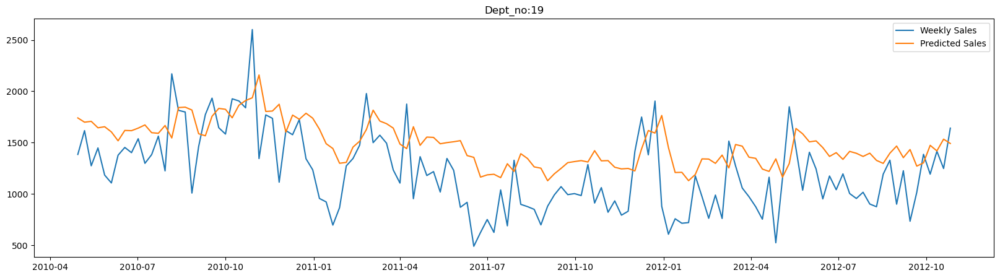

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step  


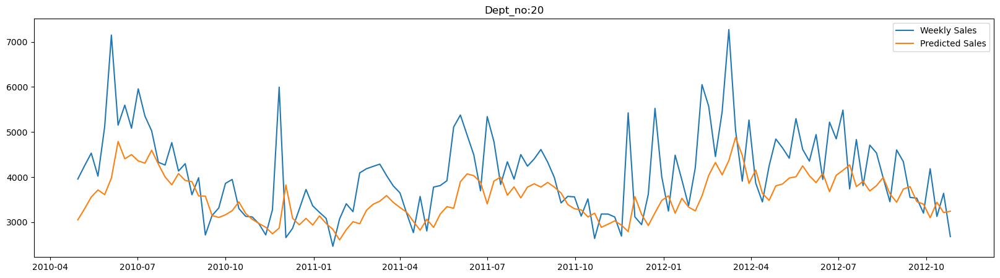

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


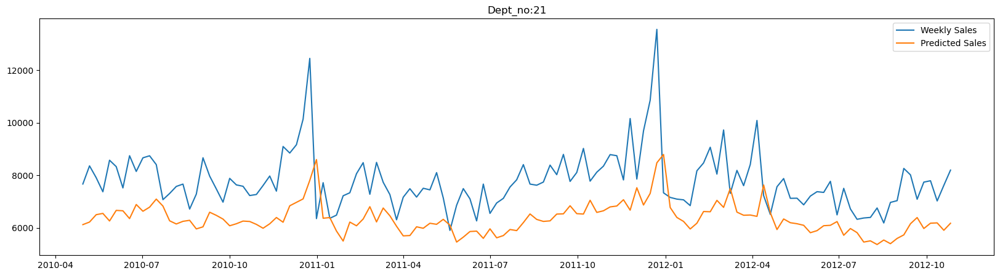

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


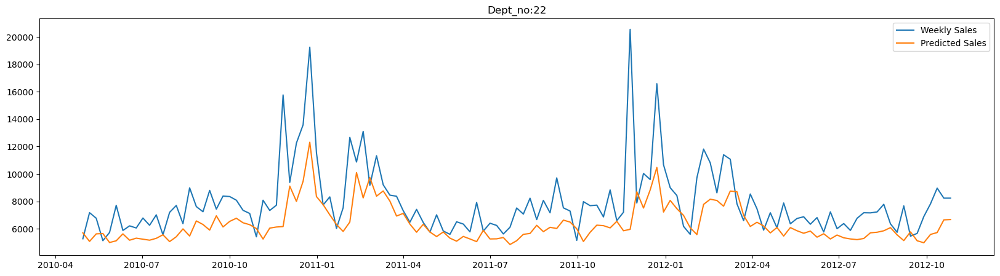

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


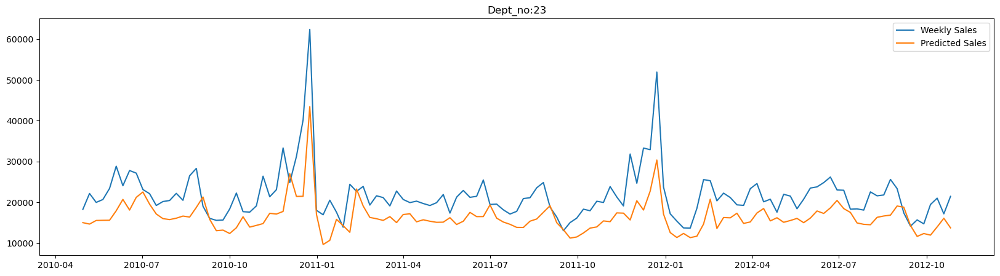

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


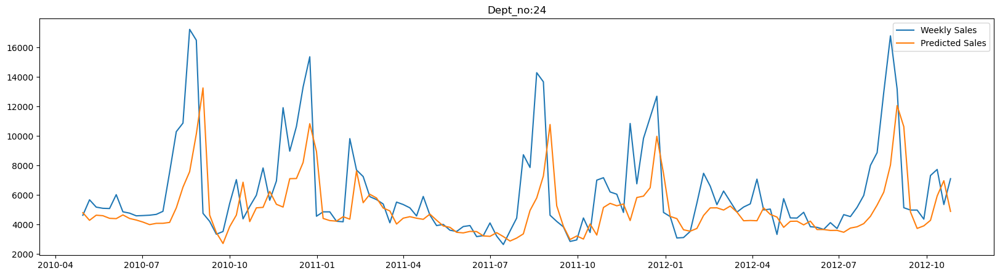

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


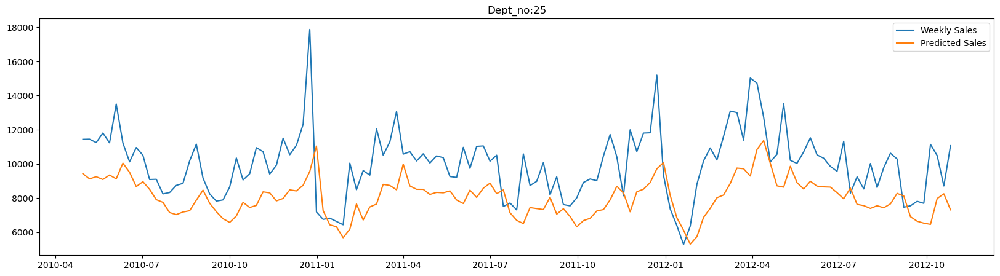

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


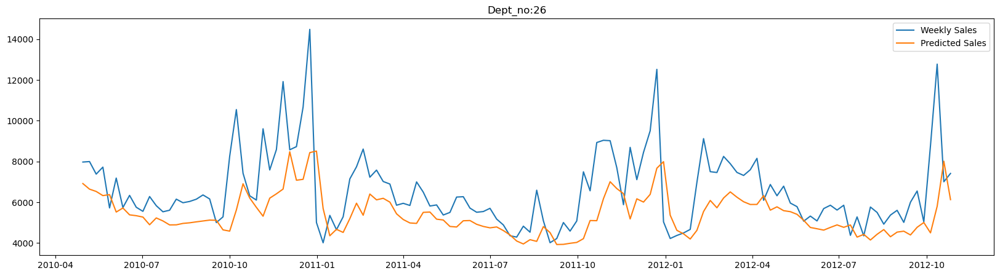

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


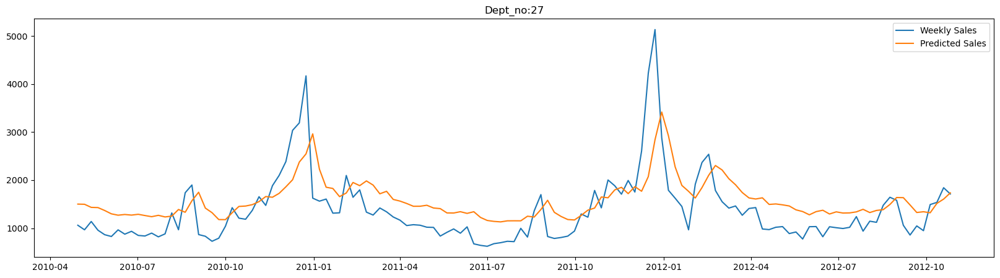

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


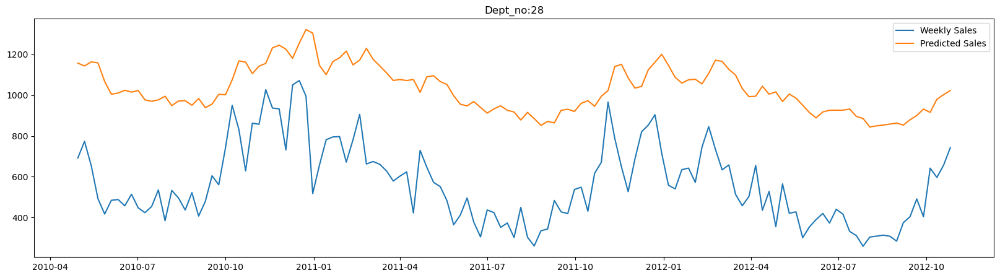

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step  


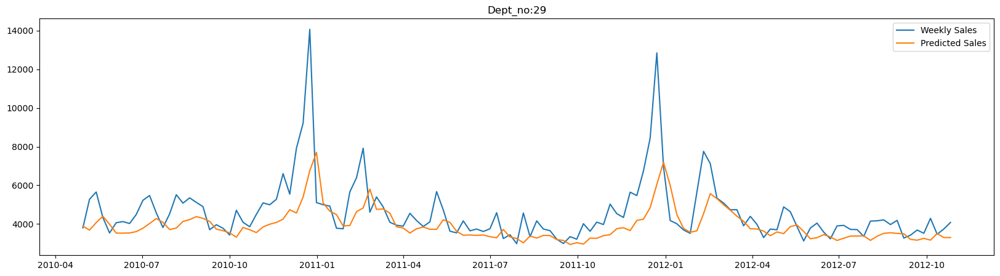

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


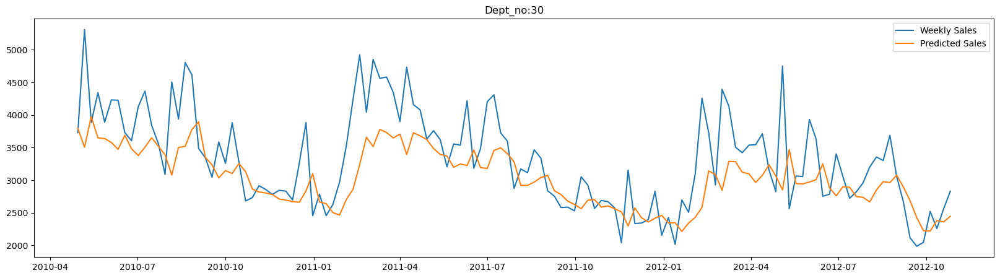

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


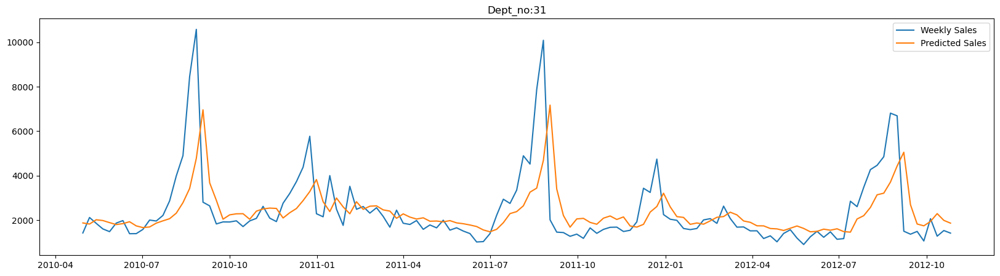

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


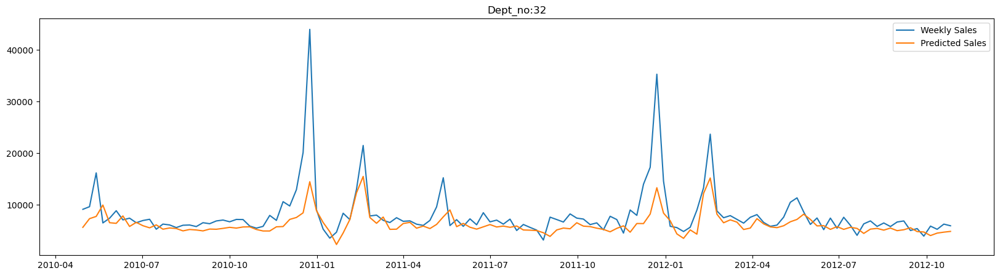

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


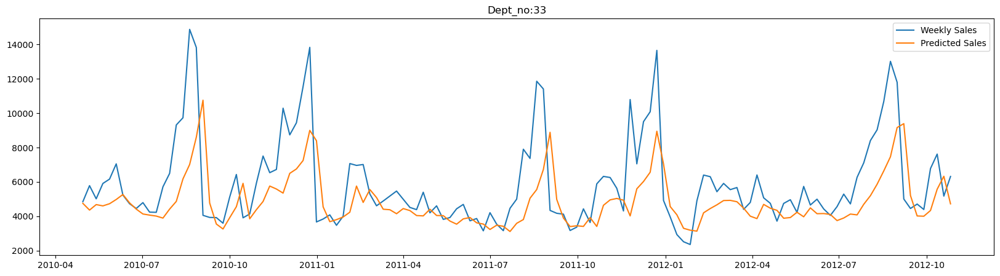

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


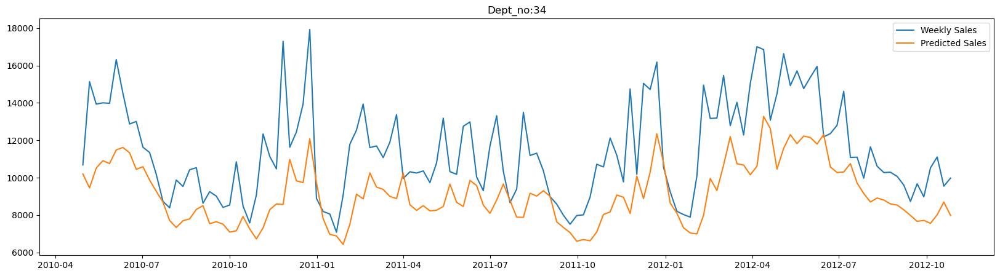

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step  


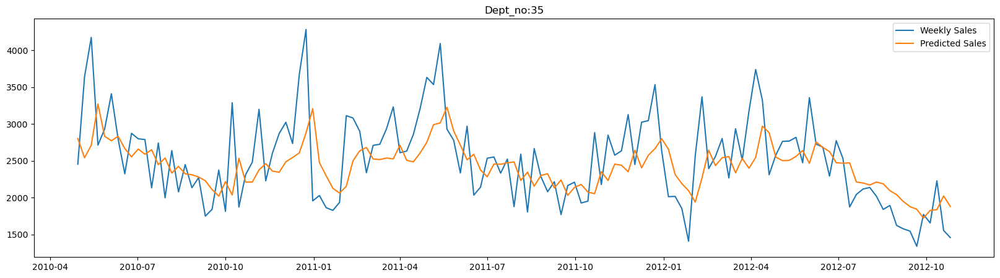

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


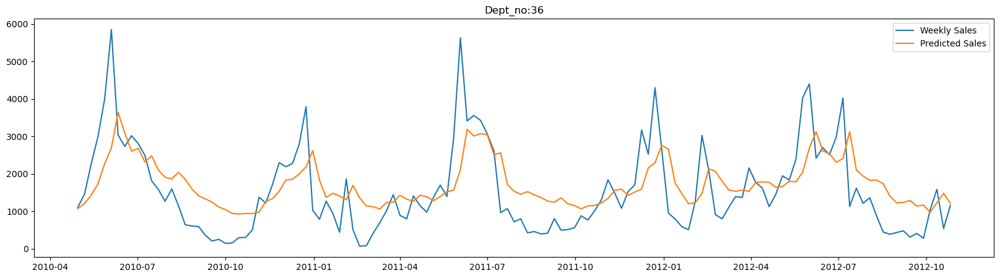

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step  


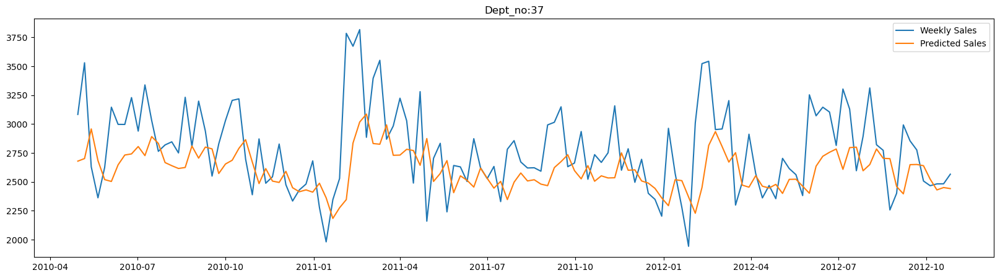

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


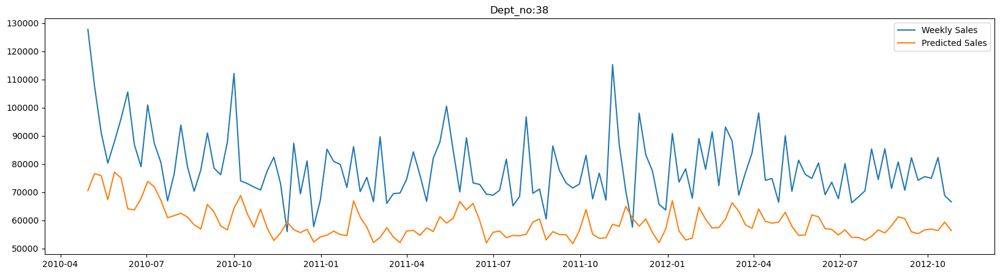

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


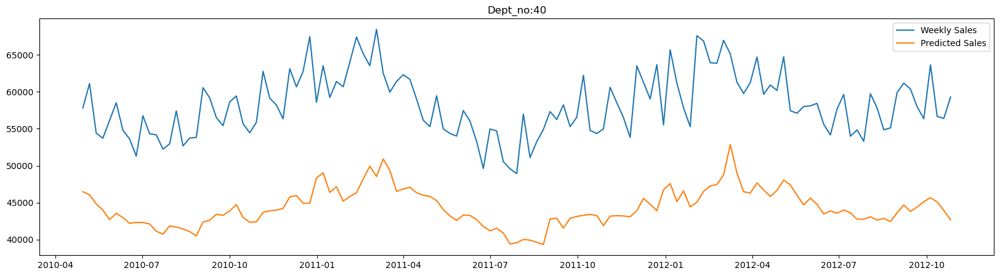

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


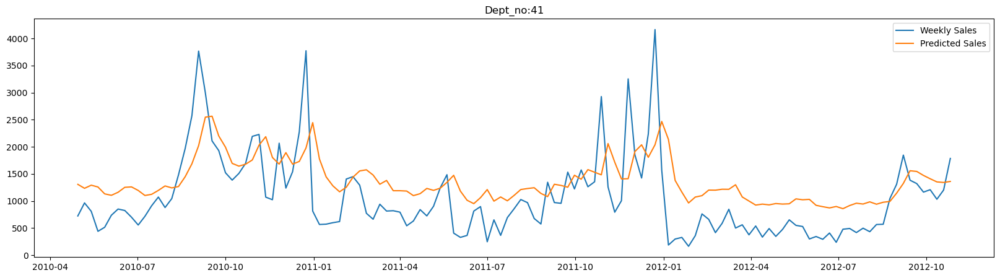

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


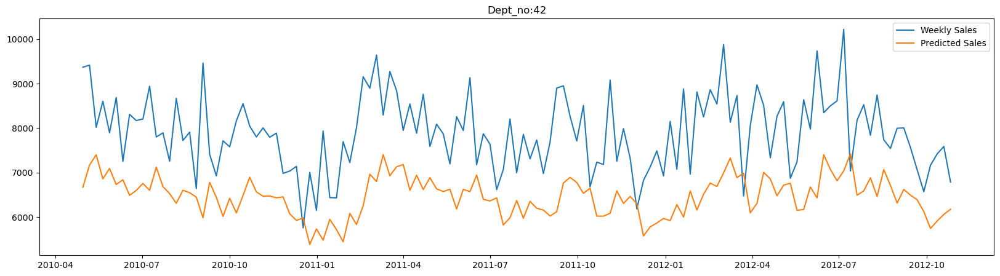

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step  


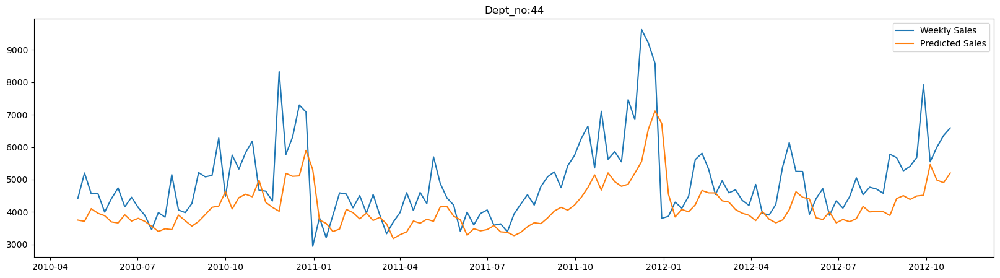

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


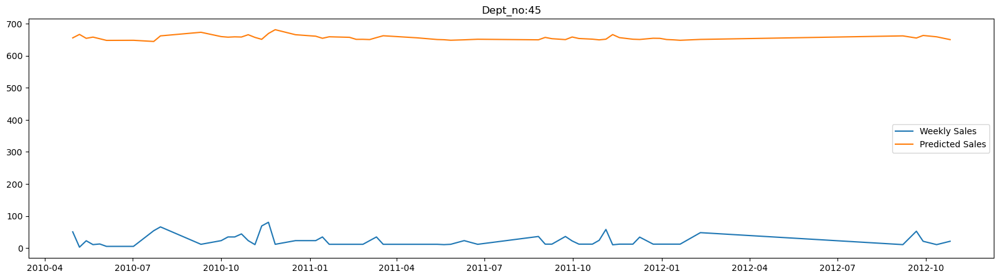

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


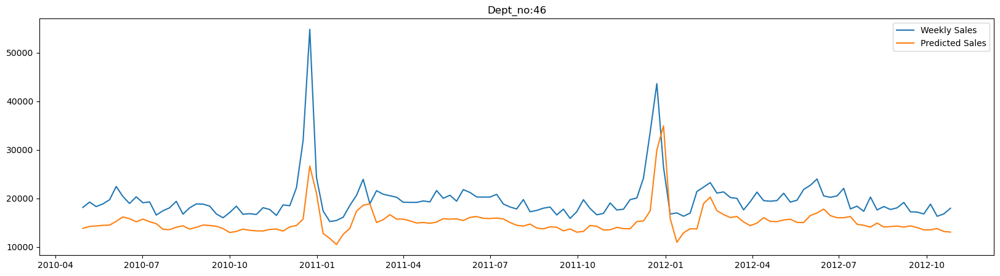

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


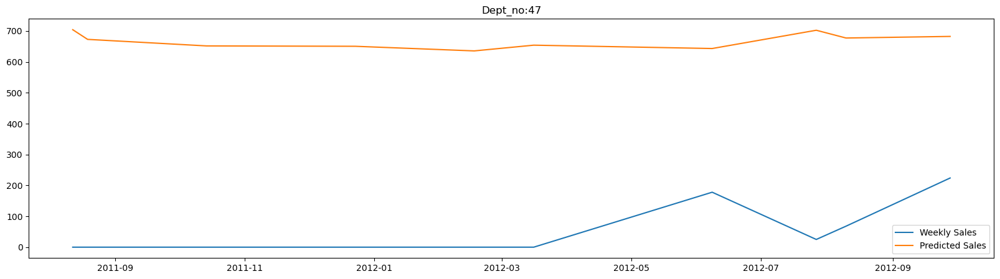

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step  


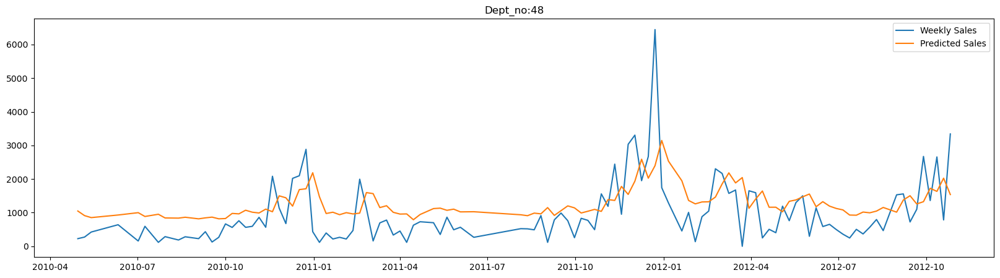

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


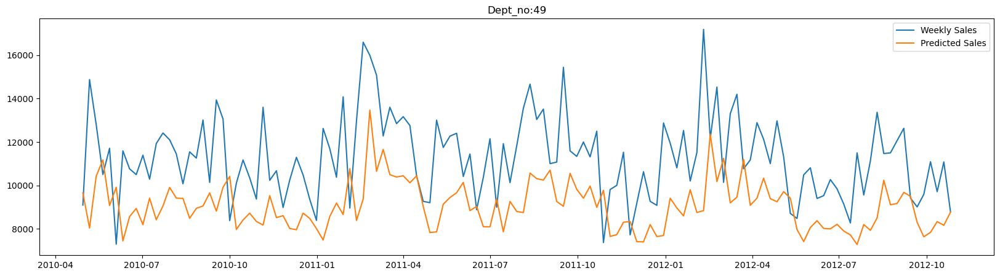

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


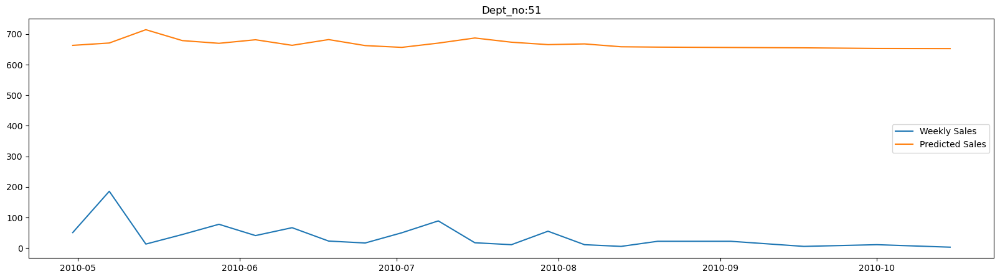

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


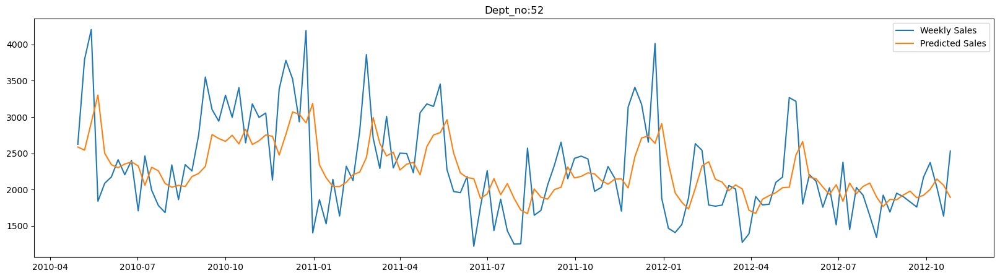

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


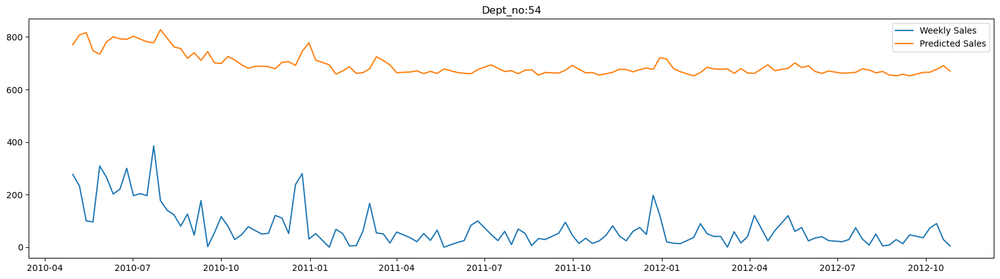

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


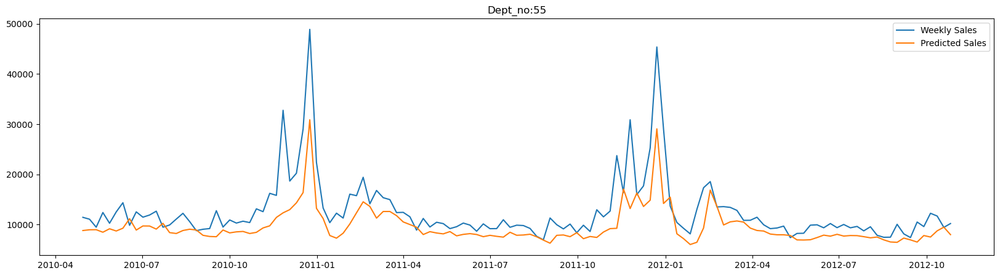

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


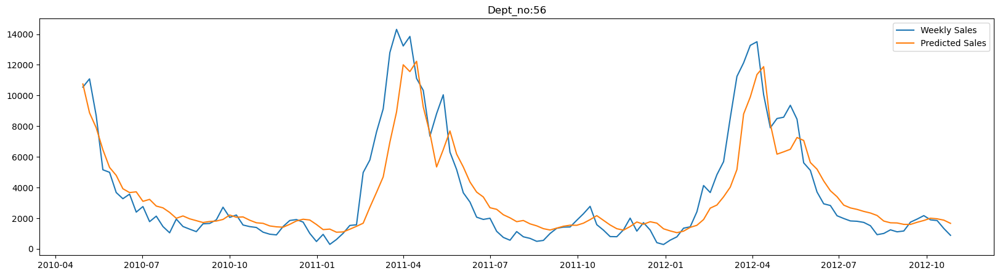

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step  


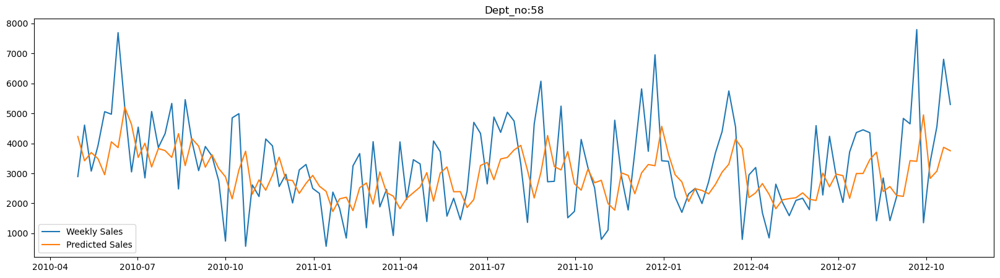

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


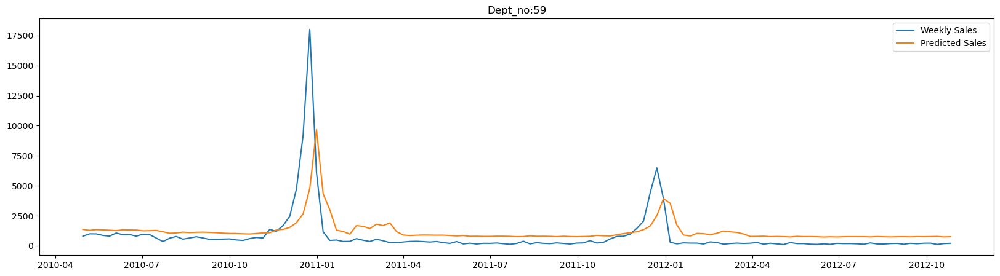

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


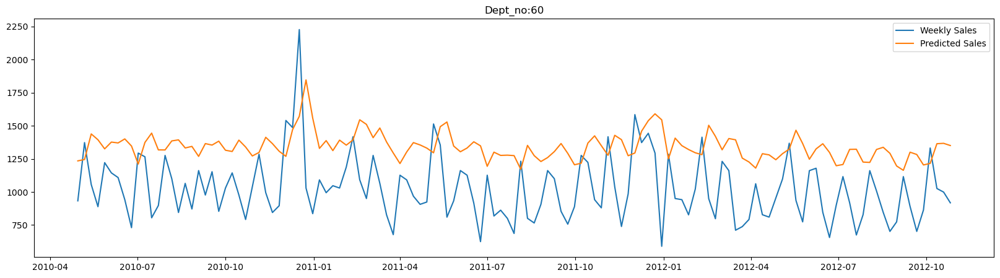

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


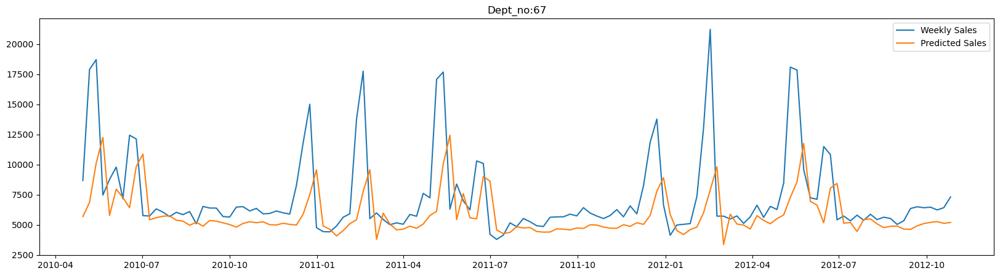

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


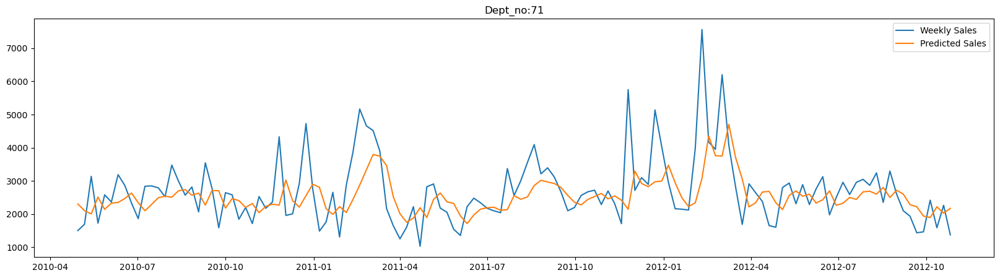

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


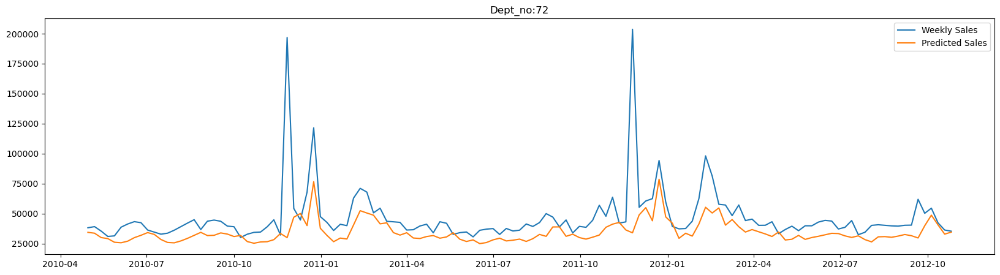

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


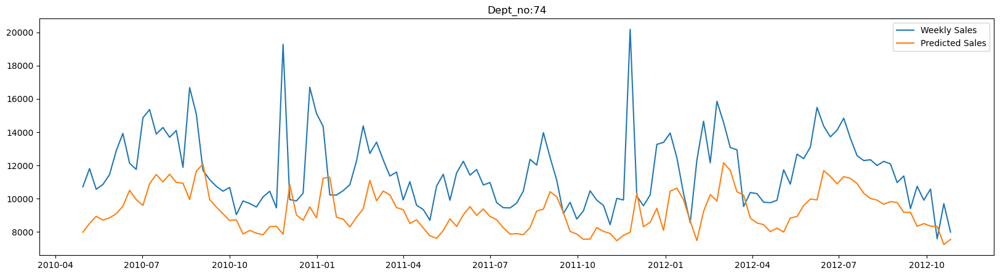

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


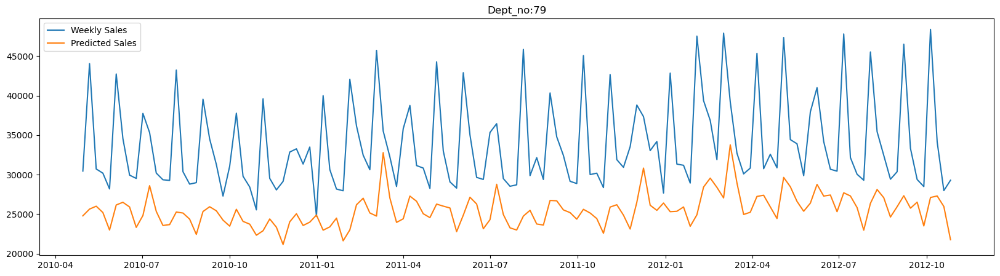

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


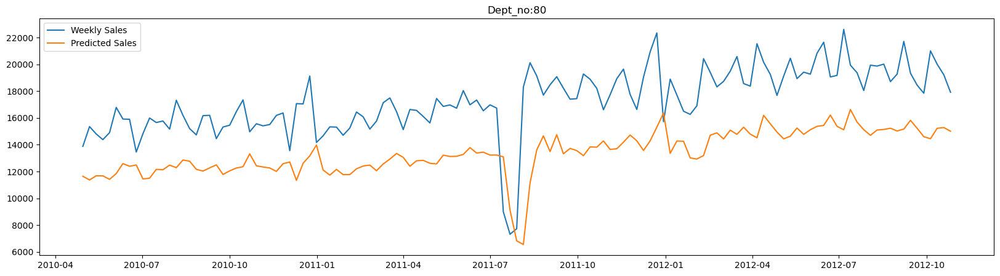

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


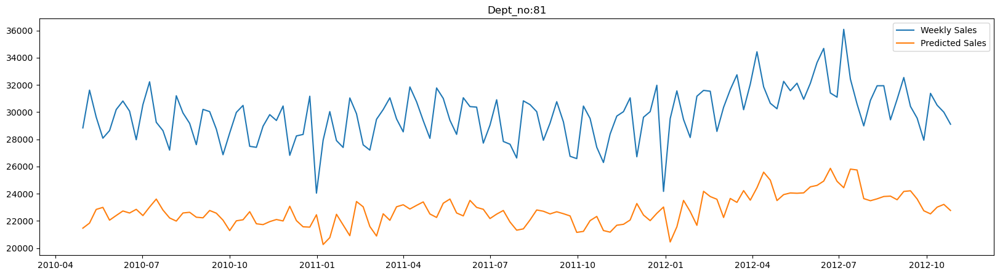

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


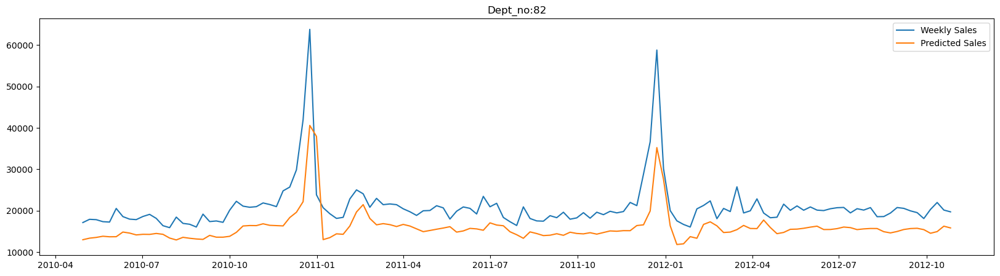

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


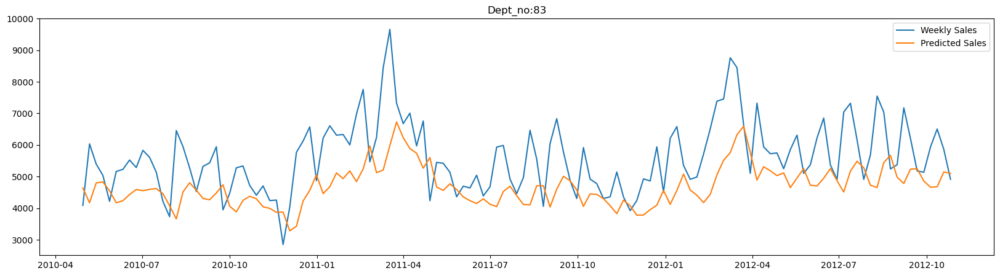

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step  


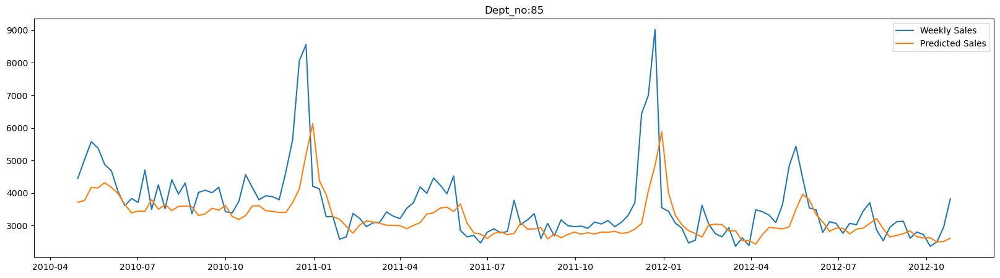

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step  


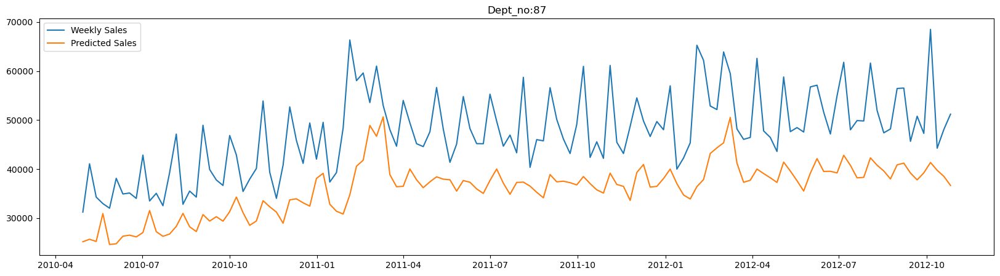

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step  


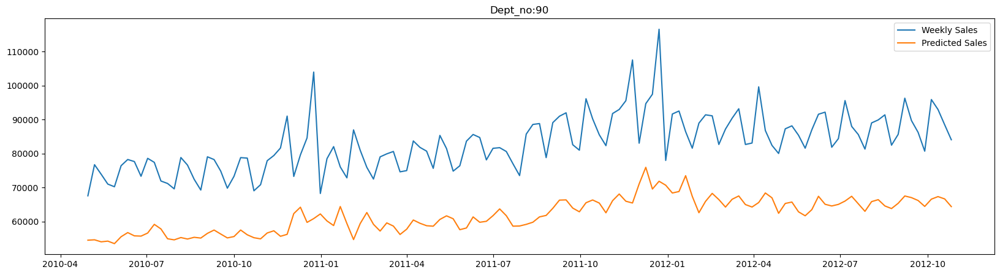

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


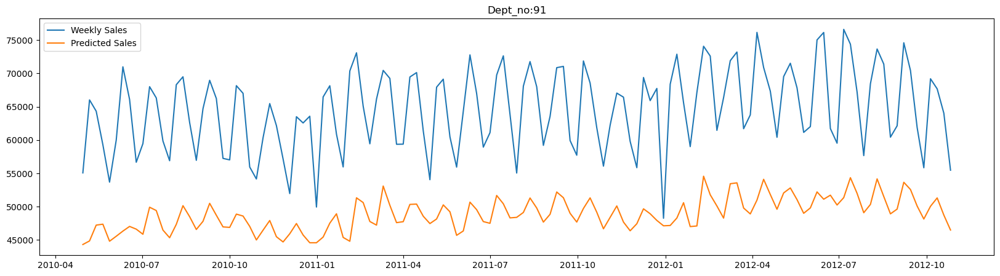

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


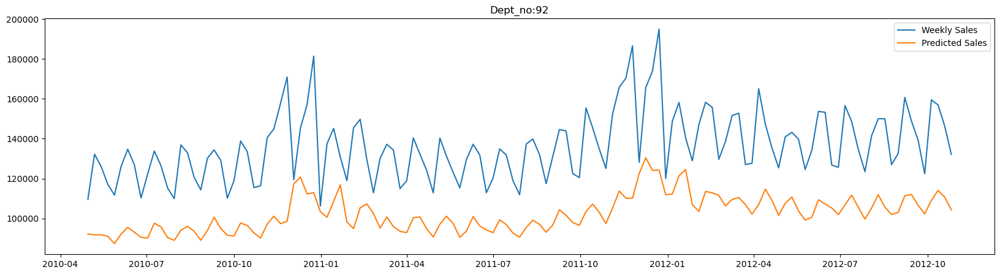

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


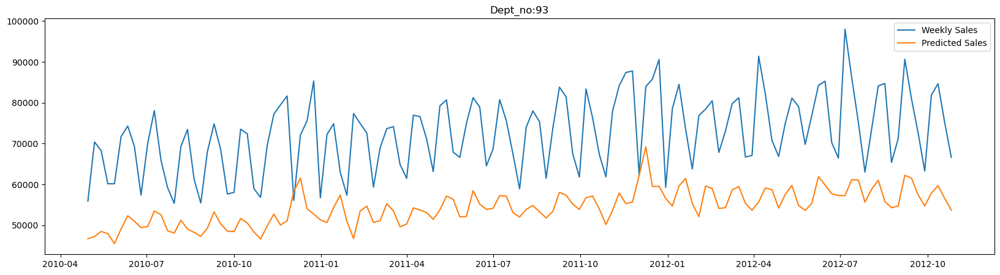

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


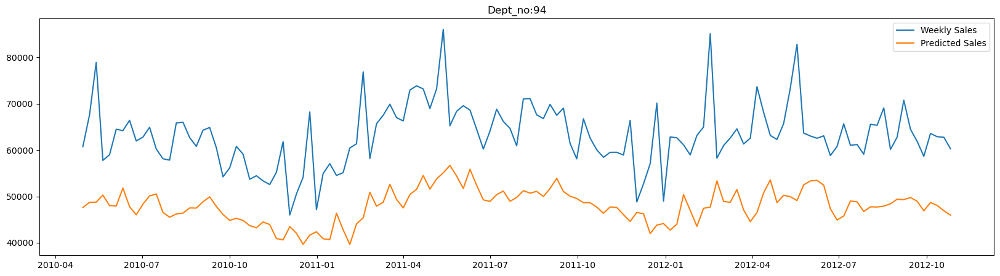

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


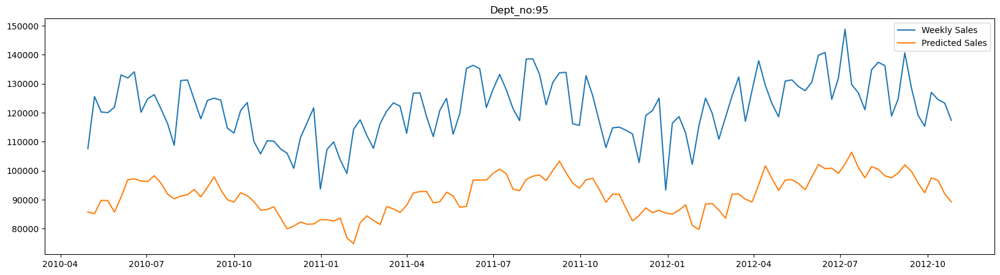

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


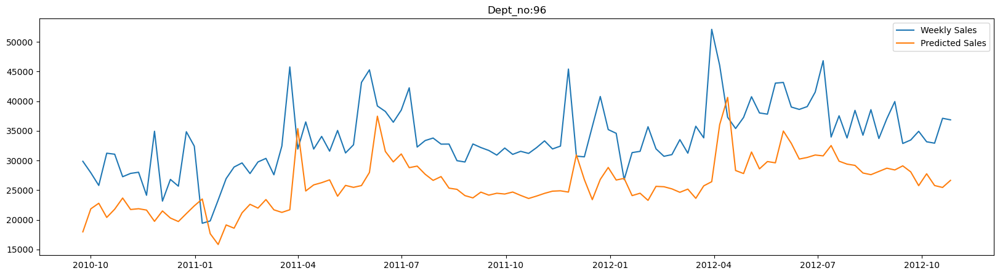

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


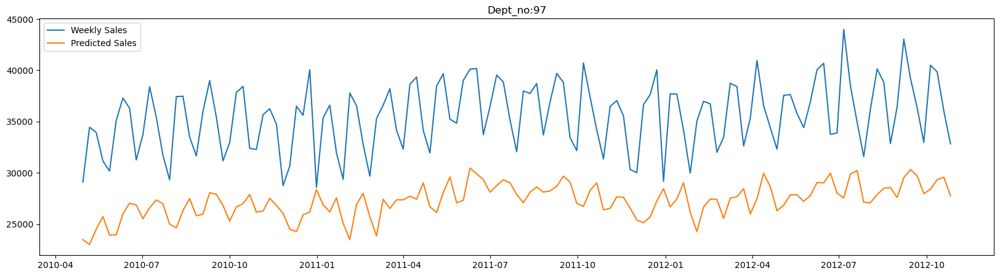

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


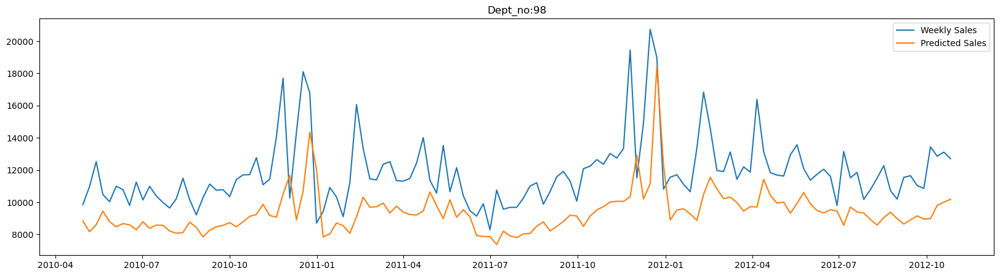

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


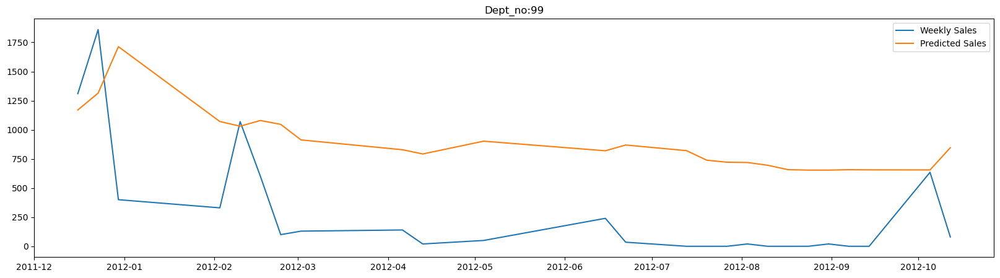

In [42]:
df_test = df_train[ (df_train['Store']==1)]
for dept in df_test['Dept'].unique():
    df_dept = df_test[ df_test['Dept'] == dept]
    if len(df_dept)>12:
        x_test, y_test = store_lstm_dataset( df_dept, 12)
        x_test = np.reshape( x_test, (x_test.shape[0],1,x_test.shape[1]))
            
        prediction = model.predict(x_test)
            
        df_pred = pd.DataFrame(scaler.inverse_transform(prediction),columns=['Weekly_Sales'] )
            
        df_actual = df2[ (df2['Store']==1) & (df2['Dept'] == dept)].iloc[12:]
            
        df_pred.set_index(df_actual.index,inplace=True)
            
        df_actual['predicted_sales'] = df_pred['Weekly_Sales']
        plt.figure( figsize=(20,5))
        plt.plot(df_actual['Weekly_Sales'], label='Weekly Sales')
        plt.plot(df_actual['predicted_sales'], label='Predicted Sales')
        plt.legend()
        plt.title(f"Dept_no:{dept}")
        plt.show()


In [43]:
df_train_predicted=pd.DataFrame()
for store in df_train['Store'].unique():
    df_test = df_train[ (df_train['Store']==store)]
    for dept in df_test['Dept'].unique():
        df_dept = df_test[ df_test['Dept'] == dept]
        if len(df_dept)>12:
            x_test, y_test = store_lstm_dataset( df_dept, 12)
            x_test = np.reshape( x_test, (x_test.shape[0],1,x_test.shape[1]))
                
            prediction = model.predict(x_test)
                
            df_pred = pd.DataFrame(scaler.inverse_transform(prediction),columns=['Weekly_Sales'] )
                
            df_actual = df2[ (df2['Store']==store) & (df2['Dept'] == dept)].iloc[12:]
                
            df_pred.set_index(df_actual.index,inplace=True)
                
            df_actual['predicted_sales'] = df_pred['Weekly_Sales']

            df_train_predicted = pd.concat([df_train_predicted, df_actual])


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step  
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step  
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step  
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step  
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step  
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step  
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
5/5 ━━━━━━━━

In [44]:
df_train_predicted

,Store,Dept,Weekly_Sales,predicted_sales
Date,,,,
2010-04-30,1,1,16555.11,12343.908203
2010-05-07,1,1,17413.94,13019.859375
2010-05-14,1,1,18926.74,13003.040039
2010-05-21,1,1,14773.04,15849.312500
2010-05-28,1,1,15580.43,9408.395508
...,...,...,...,...
2012-08-31,31,99,10.05,646.375183
2012-09-07,31,99,2.07,649.181824
2012-09-14,31,99,0.08,650.533386


In [45]:
df_train_predicted['Diff']= df_train_predicted['Weekly_Sales']-df_train_predicted['predicted_sales']

In [46]:
df_train_predicted

,Store,Dept,Weekly_Sales,predicted_sales,Diff
Date,,,,,
2010-04-30,1,1,16555.11,12343.908203,4211.201797
2010-05-07,1,1,17413.94,13019.859375,4394.080625
2010-05-14,1,1,18926.74,13003.040039,5923.699961
2010-05-21,1,1,14773.04,15849.312500,-1076.272500
2010-05-28,1,1,15580.43,9408.395508,6172.034492
...,...,...,...,...,...
2012-08-31,31,99,10.05,646.375183,-636.325183
2012-09-07,31,99,2.07,649.181824,-647.111824
2012-09-14,31,99,0.08,650.533386,-650.453386


In [47]:
df_train_predicted['Diff'].mean()

3968.636867612199

In [48]:
df_train_predicted[df_train_predicted['Weekly_Sales']==0]

,Store,Dept,Weekly_Sales,predicted_sales,Diff
Date,,,,,
2012-08-10,1,6,0.0,3133.909424,-3133.909424
2012-05-04,1,18,0.0,2102.630127,-2102.630127
2011-08-12,1,47,0.0,704.347839,-704.347839
2011-08-19,1,47,0.0,672.995300,-672.995300
2011-10-14,1,47,0.0,651.808777,-651.808777
...,...,...,...,...,...
2011-01-07,31,54,0.0,737.424988,-737.424988
2011-09-02,31,54,0.0,658.840027,-658.840027
2011-09-30,31,54,0.0,674.921082,-674.921082


In [49]:
model.save('LSTM_model_for_sales_without_MD.h5')